# reGrainable - <font color='orange'>Grain size properties v2</font>

Changes:
- update plot visualization by using local plot script utils.py
- 

Miguel Moreno, NBI-UCPH, 2024

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import label, generate_binary_structure
from skimage import (
    io,
    color,
    measure,
    img_as_float,
    img_as_uint,
    img_as_ubyte,
    exposure,
    morphology,
    feature,
)
from skimage.segmentation import clear_border, felzenszwalb, mark_boundaries
from skimage.restoration import denoise_nl_means, estimate_sigma
from skimage.filters import (
    hessian,
    frangi,
    sobel,
    meijering,
    sato,
    threshold_multiotsu,
    scharr,
    try_all_threshold,
    threshold_otsu,
)
from skimage.util import invert
from os.path import join, exists
import os
from PIL import Image

Image.MAX_IMAGE_PIXELS = 2000000000

In [2]:
import pandas as pd
import sys
import os
from pathlib import Path

project_root = Path.cwd().parents[0]  # Move one level up from current directory
sys.path.append(str(project_root))
from utils import utils
from utils.utils import *

In [3]:
# Set matplotlib backend
%matplotlib inline 
# %matplotlib notebook 
# %matplotlib qt#

In [4]:
# List of images to be analyzed
project_root = (
    Path(__file__).resolve().parents[2] if "__file__" in globals() else Path.cwd()
)
NEEM_path = project_root / "data" / "raw-images"
images_list = ["nmx3661b_1.png"]
slicing_param = pd.read_csv("../data/slicing_param.csv")

# Define image parameters
pixels_to_um = 5  # pixels to um relation
crop_img_len = 6  # length of cropped images [cm] 1cm=2000px
overlap = 1  # length of overlap of cropped images [cm]

In [5]:
# Assuming 'img' is your loaded image and 'file_name' is defined
pixels_to_um = 5  # pixels to um relation
um_to_mm = 1 / 1000  # conversion factor from micrometers to millimeters
pixel_to_mm = pixels_to_um * um_to_mm  # conversion factor from pixels to millimeters

In [6]:
# Convert from cm to px
crop_img_len_px = int(
    crop_img_len * (1 / pixels_to_um) * 10000
)  # length of one image in px
overlap_px = int(overlap * (1 / pixels_to_um) * 10000)
slicing_param.tail(10)

,name,px_left,px_top,px_bottom,px_right
65,nmx3642b_1,59023,888,6814,117782
66,nmx3642b_2,58998,1784,5950,117757
67,nmx3658b_1,4903,700,5188,114776
68,nmx3658b_2,4881,180,4900,114754
69,nmx3684b_1,5085,2468,6876,113742
70,nmx3684b_2,5062,1865,6200,113719
71,nmx3667b_1,6574,3250,6611,115044
72,nmx3667b_2,6555,1593,5100,115025
73,nmx3664d_1,5460,800,6360,115544
74,nmx3664d_2,5435,1338,5360,115519


## 1. Load image

In [7]:
# Function definition
def load_full_image(file_name, file_path, len_crop_img_px, overlap_px, df_slicing):
    """
    Load image from given path and calculate slicing parameters.
    """
    df_slic_img = df_slicing[df_slicing["name"] == file_name[:-4]]
    img_path = join(file_path, file_name)
    img = io.imread(img_path)
    total_length = df_slic_img["px_right"].iloc[0] - df_slic_img["px_left"].iloc[0]
    n = int((total_length - overlap_px) / (len_crop_img_px - overlap_px))
    print("Image loaded")
    return img, n, df_slic_img


# Ensure slicing_param and other inputs are correctly initialized as per your first message
# Assuming slicing_param is already loaded and formatted correctly

# Define the file name and path (these can be adjusted as needed)
file_name = "nmx3661b_1.png"
file_path = "../data/raw-images/"
len_crop_img_px = crop_img_len_px
overlap_px = overlap_px
df_slicing = slicing_param

Image loaded
Number of cropped images: 10
Slicing parameters for the image:
          name  px_left  px_top  px_bottom  px_right
26  nmx3661b_1     4790     350       8192    114600


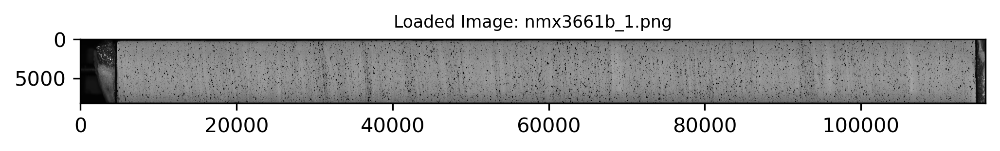

In [8]:
# Call the function
img, n, df_slic_img = load_full_image(
    file_name, file_path, len_crop_img_px, overlap_px, df_slicing
)

# Display the loaded image
fig = create_figure(figsize=(8, 4))
ax = plt.subplot()
show_image(img, pos=(111), axis=True, title=(f"Loaded Image: {file_name}"), axes=ax)

# Output the number of cropped images and the slicing parameters for the specific image
print(f"Number of cropped images: {n}")
print("Slicing parameters for the image:")
print(df_slic_img)

## 2. Crop image

In [9]:
# The function definition for cropping images
def crop_image(image, i, len_img_px, overlap_px, df_slicing):
    """
    Crop image from given full image and generate a mask for air bubbles.
    """
    cropped_img = image[
        df_slicing.px_top.iloc[0] : df_slicing.px_bottom.iloc[0],
        i * (len_img_px - overlap_px)
        + df_slicing.px_left.iloc[0] : (i + 1) * (len_img_px - overlap_px)
        + overlap_px
        + df_slicing.px_left.iloc[0],
    ]
    mask_bubbles = cropped_img < 30  # Mask threshold to identify air bubbles
    print("Image cropped")
    return cropped_img, mask_bubbles

Image cropped


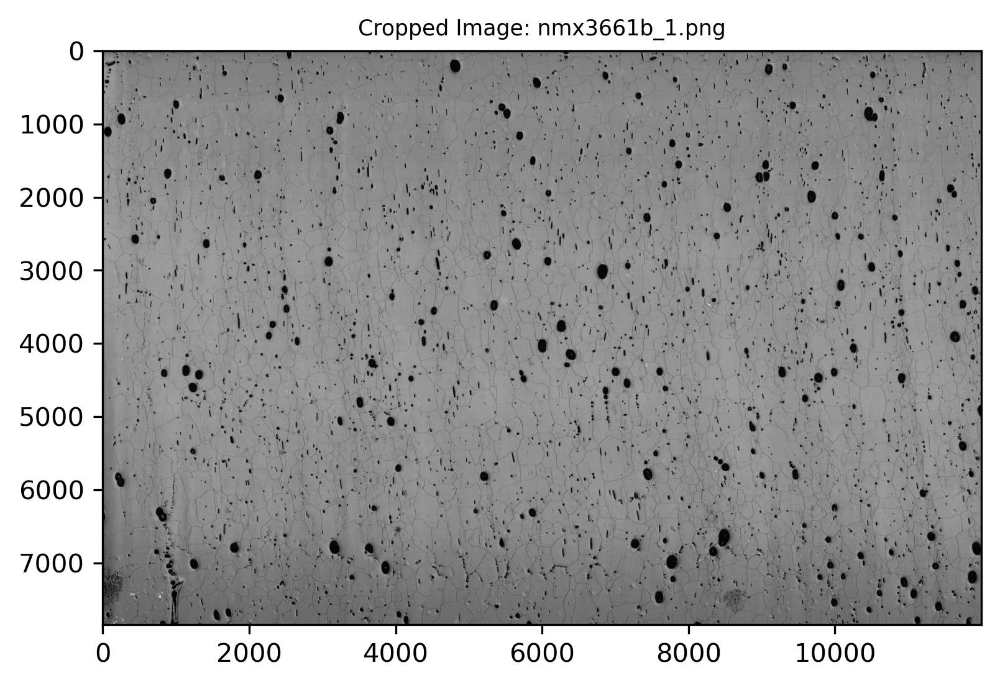

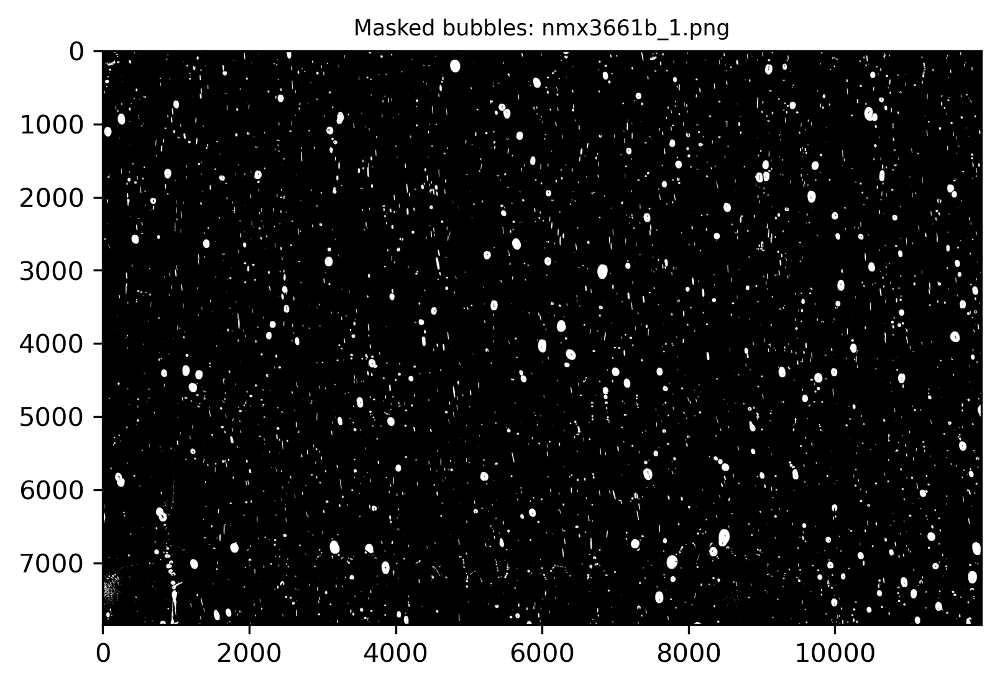

In [10]:
# Assuming img, df_slic_img from previous steps, and you want to crop the first segment
i = 0  # Change as needed for different segments
cropped_img, mask_bubbles = crop_image(img, i, crop_img_len_px, overlap_px, df_slic_img)

# Display the cropped image
fig = create_figure(figsize=(8, 4))
ax = plt.subplot()
show_image(
    cropped_img, pos=(111), axis=True, title=(f"Cropped Image: {file_name}"), axes=ax
)

# Display the mask of air bubbles
fig = create_figure(figsize=(8, 4))
ax = plt.subplot()
show_image(
    mask_bubbles, pos=(111), title=(f"Masked bubbles: {file_name}"), axis=True, axes=ax
)

## 3. Denoising

In [11]:
# Ensure all necessary libraries are imported
from skimage import restoration, util, exposure
import numpy as np
from skimage.color import rgb2gray
from skimage import img_as_float, img_as_ubyte


# Define the denoise function
def denoise(image):
    """
    Apply non-local means denoising and intensity rescale.
    """
    img_float = img_as_float(image)
    sigma_est = np.mean(restoration.estimate_sigma(img_float, channel_axis=None))
    patch_kw = dict(
        patch_size=5,  # 5x5 patches
        patch_distance=6,  # 13x13 search area
        channel_axis=None,
    )  # None for greyscale image
    img_denoised = restoration.denoise_nl_means(
        img_float, h=0.6 * sigma_est, sigma=sigma_est, fast_mode=True, **patch_kw
    )
    img_denoised_uint = img_as_ubyte(img_denoised)
    p2, p95 = np.percentile(img_denoised_uint, (2, 95))
    rescaled = exposure.rescale_intensity(img_denoised_uint, in_range=(p2, p95))
    print("Image denoised and rescaled")
    return rescaled

Image denoised and rescaled


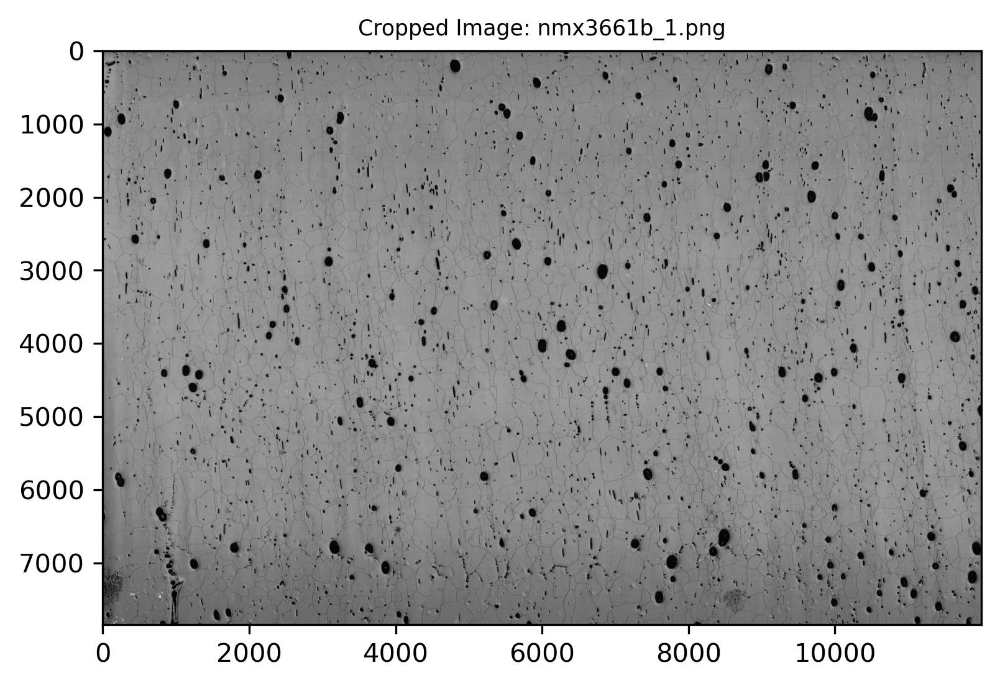

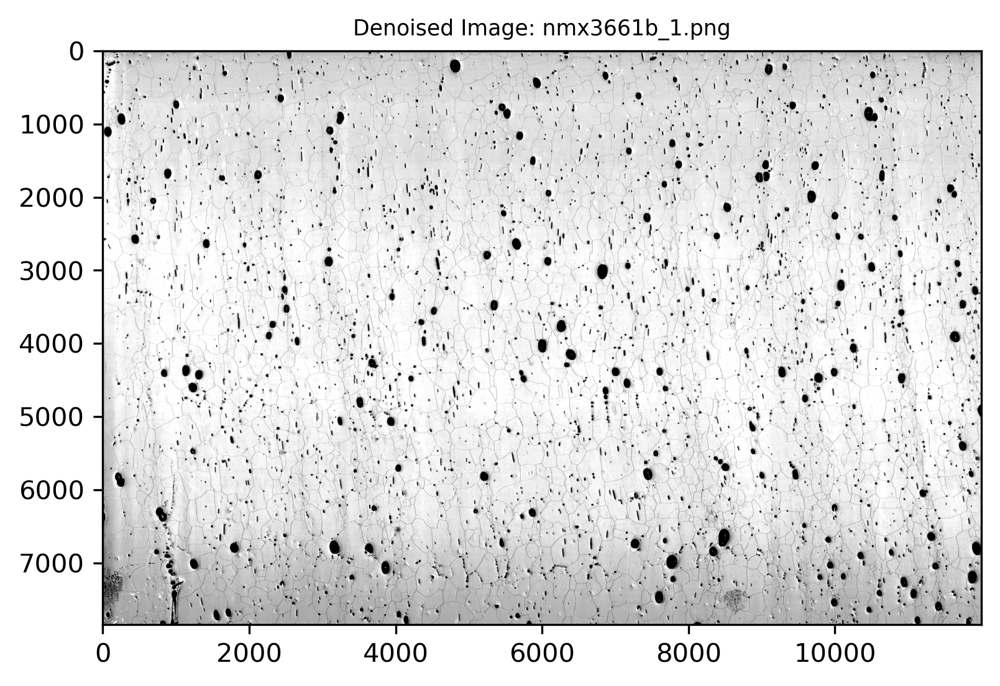

In [12]:
# Call the denoise function on the cropped image
denoised_img = denoise(cropped_img)

# Display the cropped image for comparison
fig = create_figure(figsize=(8, 4))
ax = plt.subplot()
show_image(
    cropped_img, pos=(111), title=(f"Cropped Image: {file_name}"), axis=True, axes=ax
)

# Display the denoised image
fig = create_figure(figsize=(8, 4))
ax = plt.subplot()
show_image(
    denoised_img, pos=(111), title=(f"Denoised Image: {file_name}"), axis=True, axes=ax
)

## 5. Hessian ridge detection

In [13]:
# Hypothetical import, assuming 'hessian' is a function you have access to
from skimage.filters import hessian


def hessian_filter(image):
    """
    Apply a Hessian-based filter to enhance features or edges in an image.
    """
    # The parameters used here are illustrative; adjust them as needed
    # hessian_img = hessian(image, sigmas=[0, 2], alpha=.5, beta=.5, gamma=15, black_ridges=True, mode='reflect', cval=0)
    hessian_img = hessian(
        image,
        sigmas=[0.1, 0.5],
        alpha=0.5,
        beta=0.5,
        gamma=15,
        black_ridges=True,
        mode="reflect",
        cval=0,
    )
    print("Hessian filter applied")
    return hessian_img

Hessian filter applied


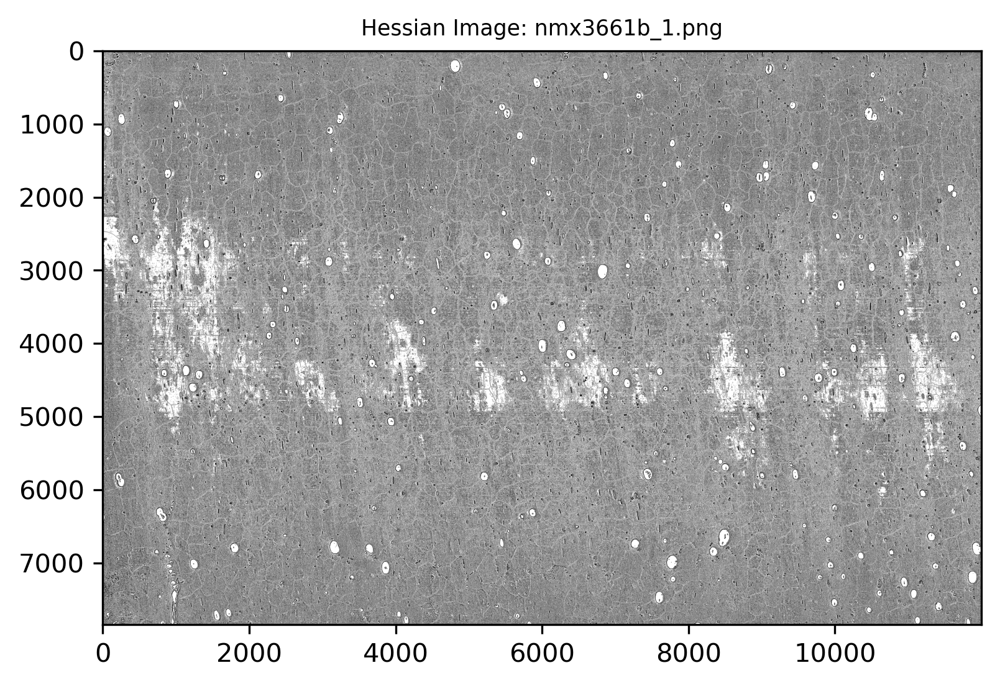

In [14]:
# Apply the hypothetical Hessian filter to an image
# Replace 'binary_img' with the appropriate input image variable if different
hessian_img = hessian_filter(denoised_img)

# Display the hessian filter
fig = create_figure(figsize=(8, 4))
ax = plt.subplot()
show_image(
    hessian_img, pos=(111), title=(f"Hessian Image: {file_name}"), axis=True, axes=ax
)

hessian filter takes 45 seconds to run

## 6. Morphology

In [15]:
# Import necessary libraries
import numpy as np
from skimage import morphology


def cleaning(image, mask):
    """
    Perform morphological filtering to clean the image using the provided mask.
    """
    # Subtract the mask from the image and ensure no negative values
    image_bubbles = image - mask
    image_bubbles = np.where(image_bubbles < 0, 0, image_bubbles)
    # Apply diameter closing to clean the image
    clean_image = morphology.diameter_closing(image_bubbles, diameter_threshold=1000)
    print("Cleaned image")
    return clean_image

Cleaned image


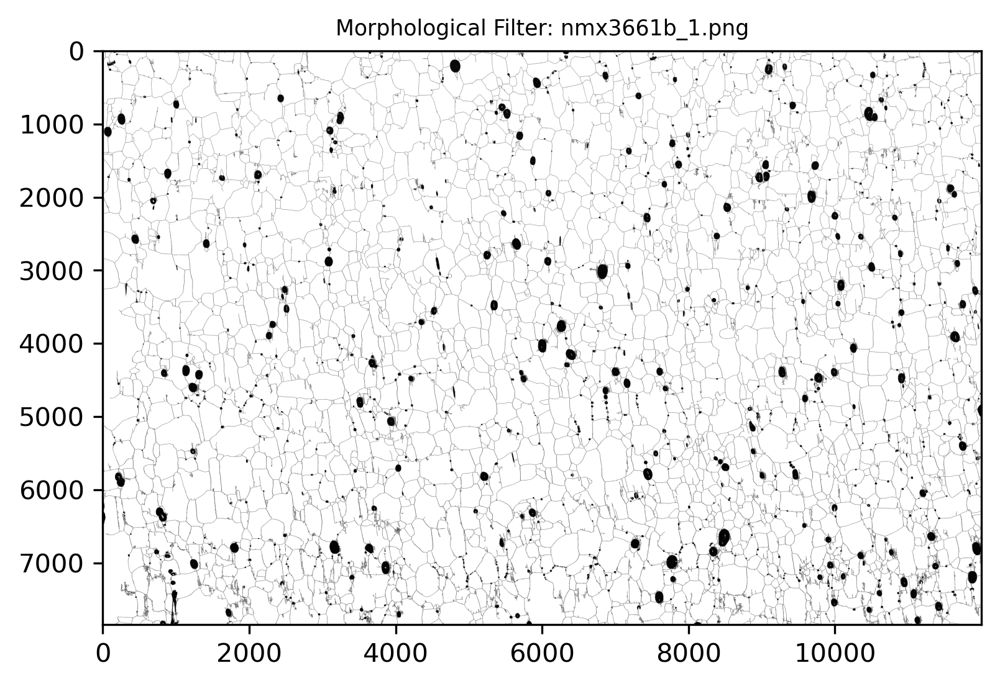

In [16]:
mask = (
    mask_bubbles  # This should be replaced with an appropriate mask for your use case
)
cleaned_image = cleaning(hessian_img, mask)

# Display the cleaned image
fig = create_figure(figsize=(8, 4))
ax = plt.subplot()
show_image(
    cleaned_image,
    pos=(111),
    title=(f"Morphological Filter: {file_name}"),
    axis=True,
    axes=ax,
)

## 7. Grain Size Labels

In [17]:
print(images_list[i])

nmx3661b_1.png


In [20]:
# 6. grain sizes label
def label_grains(clean_img, original_img, file_name, n, pixels_to_um):
    mask = clean_img == 1
    cleared_img = clear_border(mask)
    s = generate_binary_structure(2, 1)
    labeled_mask, num_labels = label(cleared_img, structure=s)
    label_color = color.label2rgb(labeled_mask)
    uint = img_as_ubyte(label_color)
    if not os.path.exists(join("Plots/NEEM_Labeled_and_Raw_Images", file_name[:-4])):
        os.makedirs(join("Plots/NEEM_Labeled_and_Raw_Images", file_name[:-4]))
    io.imsave(
        "Plots/NEEM_Labeled_and_Raw_Images/{}/{}_{}.png".format(
            file_name[:-4], file_name[:-4], n
        ),
        uint,
    )
    io.imsave(
        "Plots/NEEM_Labeled_and_Raw_Images/{}/{}_{}_raw.png".format(
            file_name[:-4], file_name[:-4], n
        ),
        original_img,
    )
    print("color labels")
    # fig, ax = plt.subplots(1,1,figsize=(12,7))
    # ax.imshow(label_color)
    # ax.set_title("Labels color")
    # fig.tight_layout()
    # fig.show()
    clusters = measure.regionprops(labeled_mask, original_img)

    fname = file_name.replace(".png", "_{}.csv".format(n))
    propList = [
        "area",
        "equivalent_diameter",
        "centroid_x",
        "centroid_y",
        "orientation",
        "major_axis_length",
        "minor_axis_length",
        "perimeter",
    ]

    if not os.path.exists(
        join(
            "./data/csv/grain_properties",
            file_name[:-4],
        )
    ):
        os.makedirs(
            join(
                "./data/csv/grain_properties",
                file_name[:-4],
            )
        )
    output_file = open(
        "./data/csv/grain_properties/{}/".format(file_name[:-4]) + fname,
        "w",
    )
    output_file.write(
        "," + ",".join(propList) + "\n"
    )  # join strings in array by commas, leave first cell blank

    for cluster_props in clusters:
        # output cluster properties to the excel file
        output_file.write(str(cluster_props["label"]))
        for i, prop in enumerate(propList):
            if prop == "area":
                to_print = cluster_props[
                    prop
                ]  # *pixels_to_um**2   #Convert pixel square to um square
            elif prop == "orientation":
                to_print = (
                    cluster_props[prop] * 57.2958
                )  # Convert to degrees from radians
            elif prop == "centroid_x":
                to_print = cluster_props["centroid"][1]
            elif prop == "centroid_y":
                to_print = cluster_props["centroid"][0]
            else:
                to_print = cluster_props[prop]  # Reamining props
            output_file.write("," + str(to_print))
        output_file.write("\n")
    output_file.close()  # Closes the file, otherwise it would be read only.
    print("written csv")


final = label_grains(cleaned_image, cropped_img, images_list[i], 0, pixels_to_um)

color labels
written csv
